# EXPERIMENT - STATE-GROUP-None

# State Groups:

- `group_1`: Patients with low toxicity and low tumor size  - W_0 ~ N(0.5, 0.16**2), T_0 ~ N(0.5, 0.16**2)
- `group_2`: Patients with high toxicity and low tumor size - W_0 ~ N(1.5, 0.16**2), T_0 ~ N(0.5, 0.16**2)
- `group_3`: Patients with low initial toxicity and high tumor size - W_0 ~ N(0.5, 0.16**2), T_0 ~ N(1.5, 0.16**2)
- `group_4`: Patients with high toxicity and high tumor size - W_0 ~ N(1.5, 0.16**2), T_0 ~ N(1.5, 0.16**2)
-  `None`  : Patients with toxicity and tumor size sample from - W_0 ~ U(0,2), T_0 ~  U(0,2)

In [1]:
%load_ext autoreload
%autoreload 2

import tqdm
import _set_path
from pbpi.algo_core.training import evaluations_per_config

In [2]:
ALGO_TYPE = {'original': {'name': 'original', 'exploration': False}
            ,'modified': {'name': 'modified', 'exploration': True} }

---
## Original experiment setup

### Original algorithm

In [3]:
############################################
################## INPUTS ##################

# Configs to test
N_STATES = 1000

configs = { 'CONFIG_NO': 1
          , 'S': [N_STATES]
          , 'Actions' : [6]
          , 'Roll-outs': [10]
          , 'Significance' : [0.1]
          , 'init_state_group': None
          , 'init_state_tag': 'gn'
          }

algorithm = ALGO_TYPE['original']

############################################
############################################

# Algorithm configs
ALGO_NAME = algorithm['name']
EXPLORE_LOGIC = algorithm['exploration']

Runs:   0%|          | 0/1 [00:00<?, ?it/s]
State generation seed is 3


Currently evaluated configs:
 Samples: 1000 | Actions: 6 | Roll-outs: 10 | Significance: 0.1


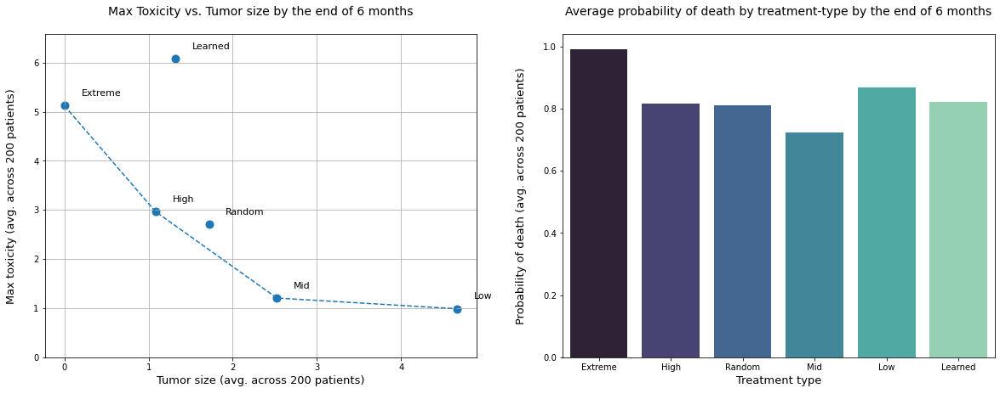

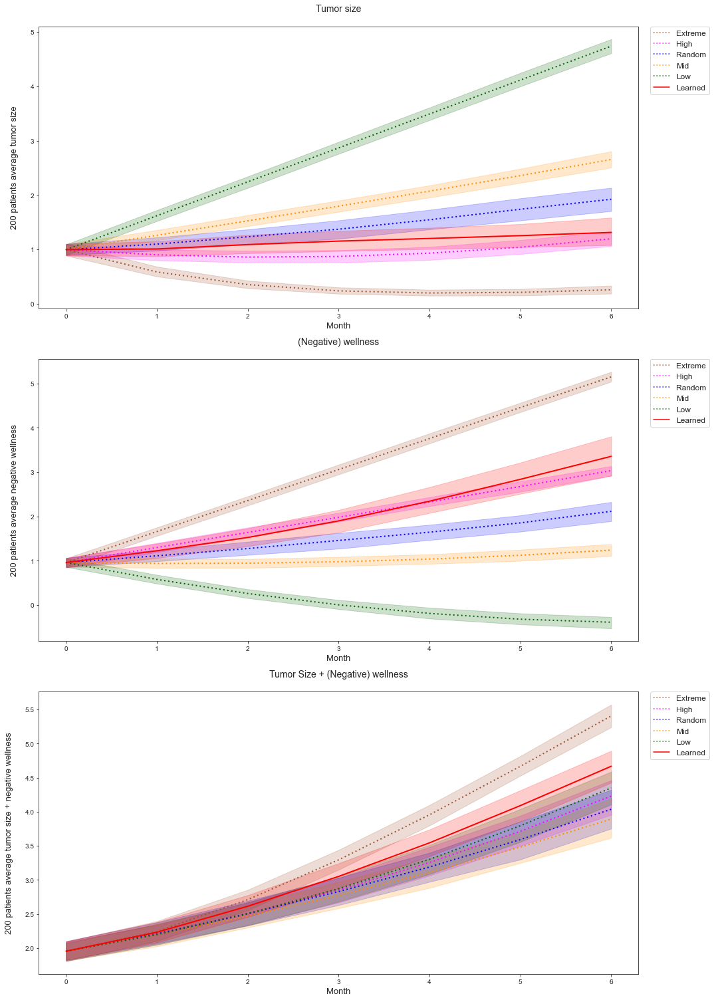


Policy Iteration: 1 - Evaluation results:
                         - Avg. ending tumor size : 1.313835948424786
                         - Avg. max. toxicity : 6.0795582583369985
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.053510635656218
                         - Avg. prob. of death : 0.822426605955236



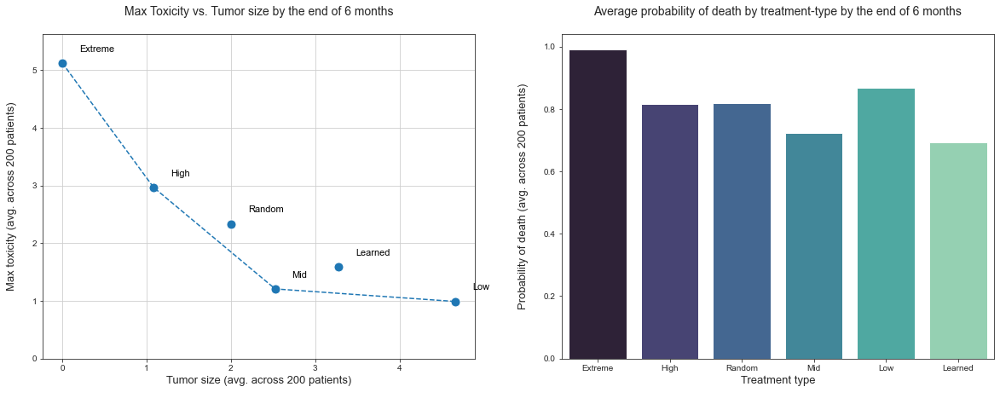

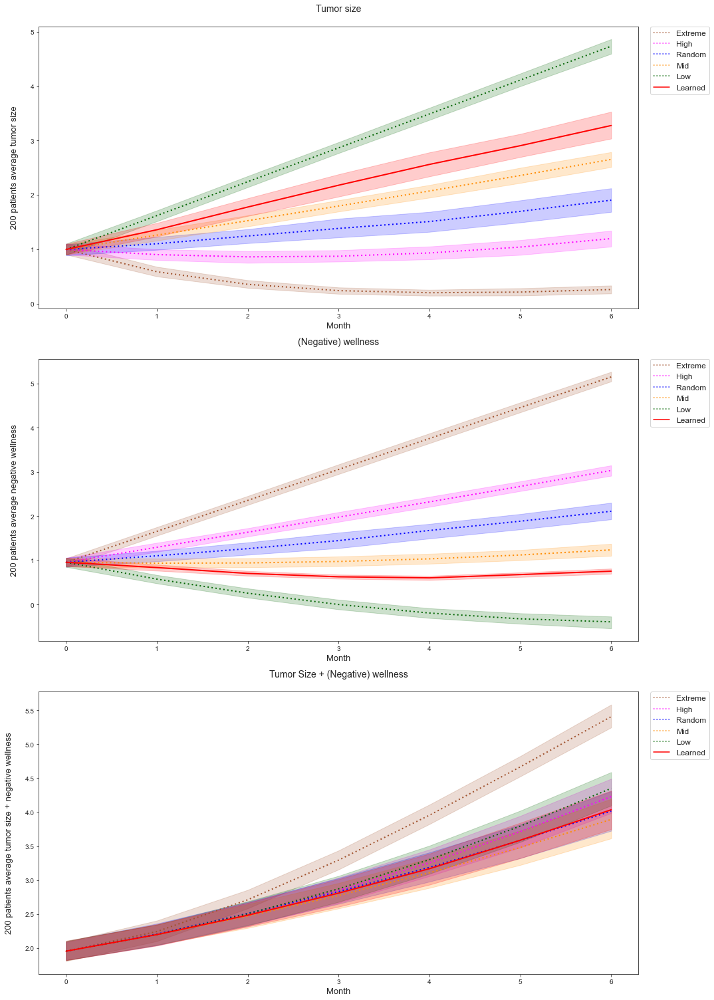


Policy Iteration: 2 - Evaluation results:
                         - Avg. ending tumor size : 3.2780122308096753
                         - Avg. max. toxicity : 1.5875096256882002
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.0072834430017434
                         - Avg. prob. of death : 0.6920283048590571



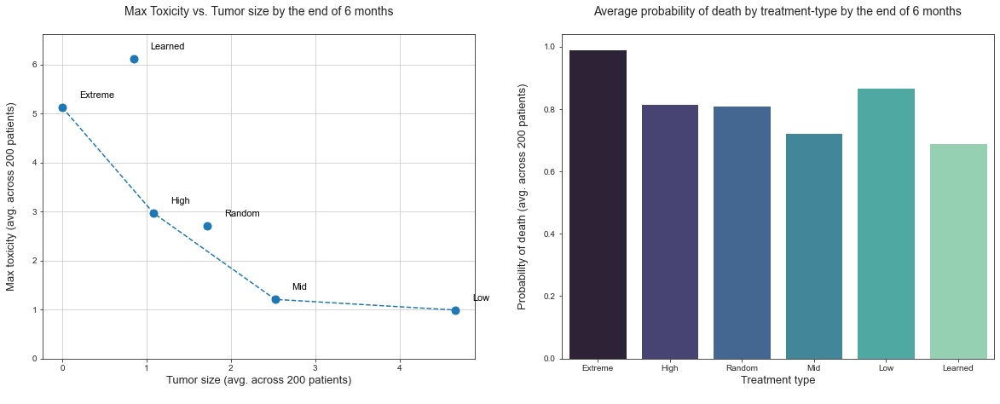

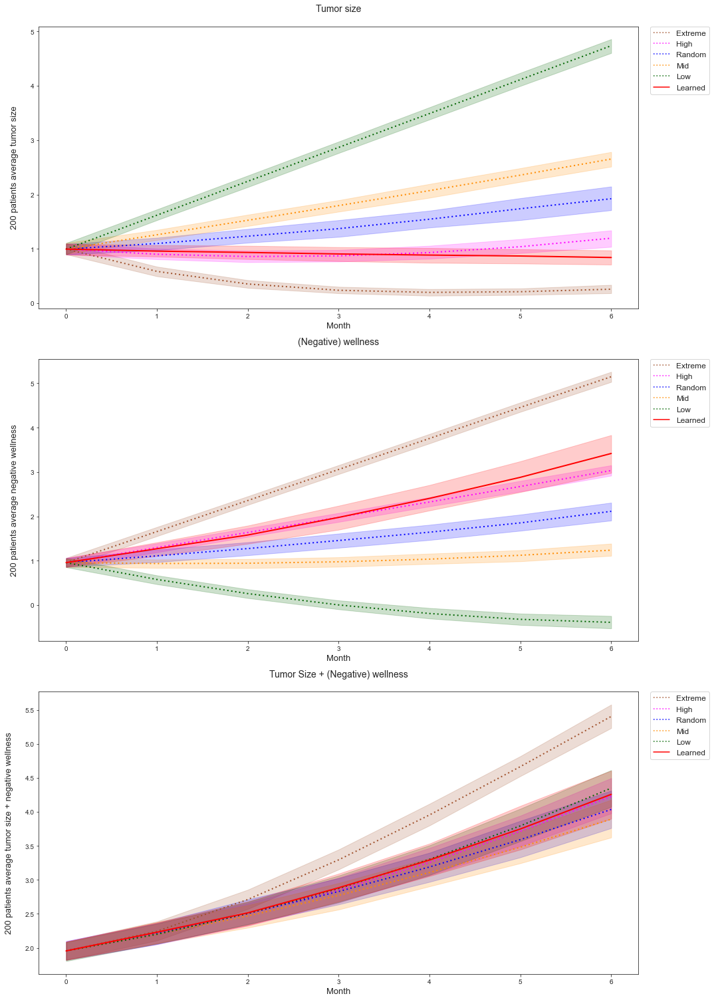


Policy Iteration: 3 - Evaluation results:
                         - Avg. ending tumor size : 0.8440842548726163
                         - Avg. max. toxicity : 6.119125531251104
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.023219391354537
                         - Avg. prob. of death : 0.6903874449836668



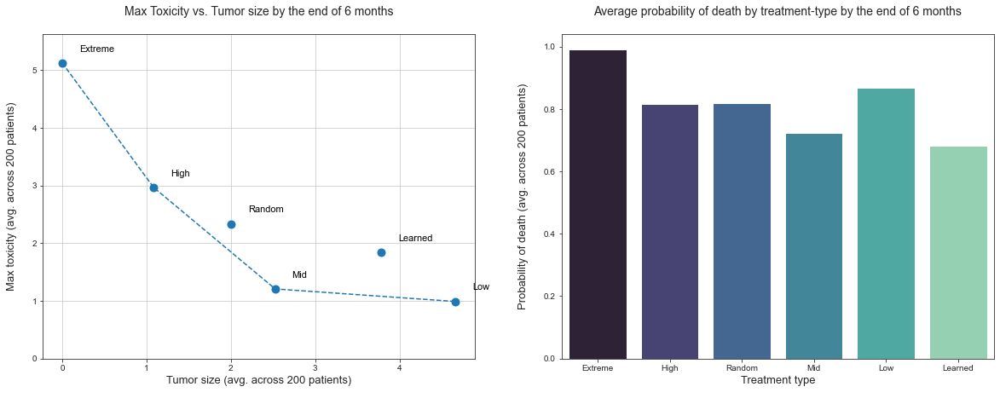

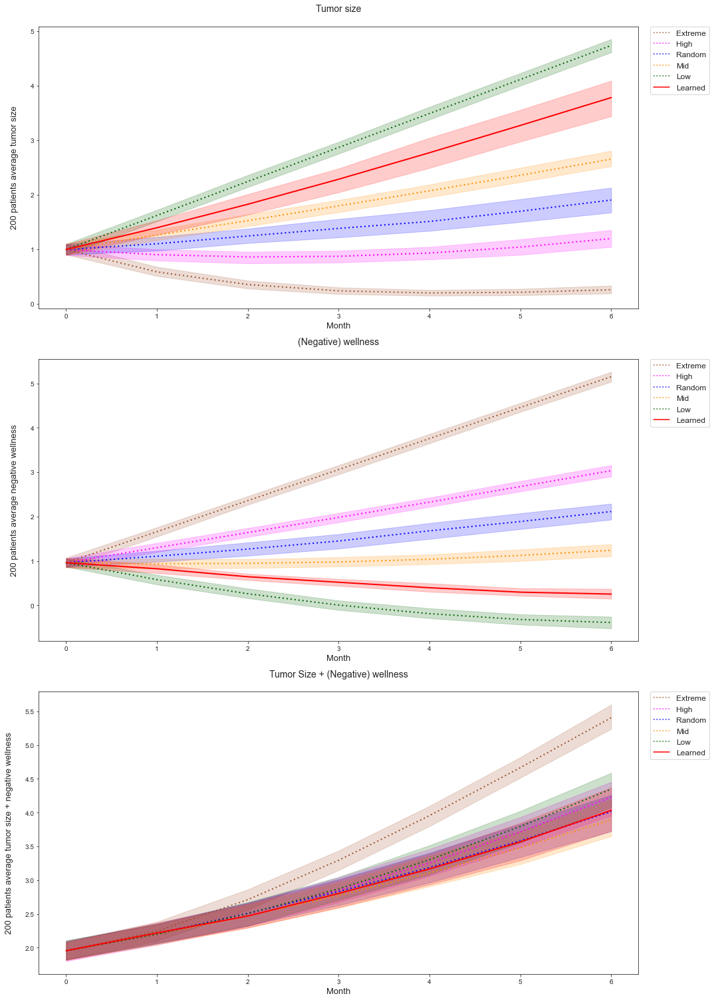


Policy Iteration: 4 - Evaluation results:
                         - Avg. ending tumor size : 3.7823376906171777
                         - Avg. max. toxicity : 1.8407328566260552
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.0067212963310075
                         - Avg. prob. of death : 0.681873230436576



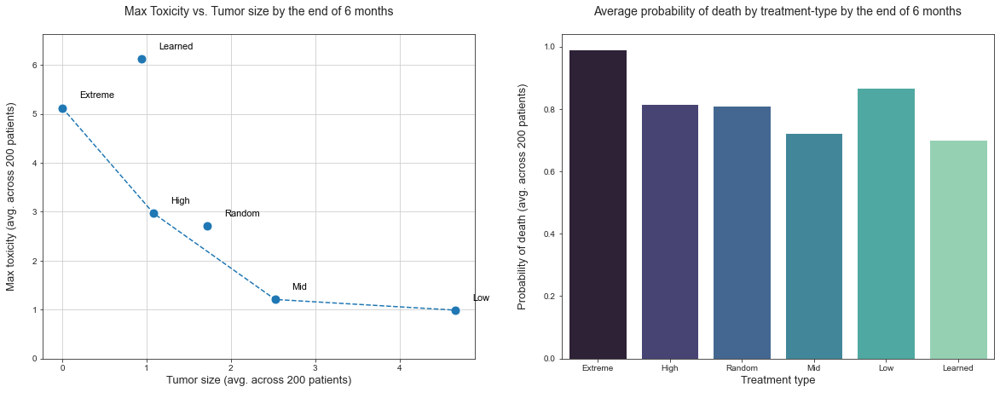

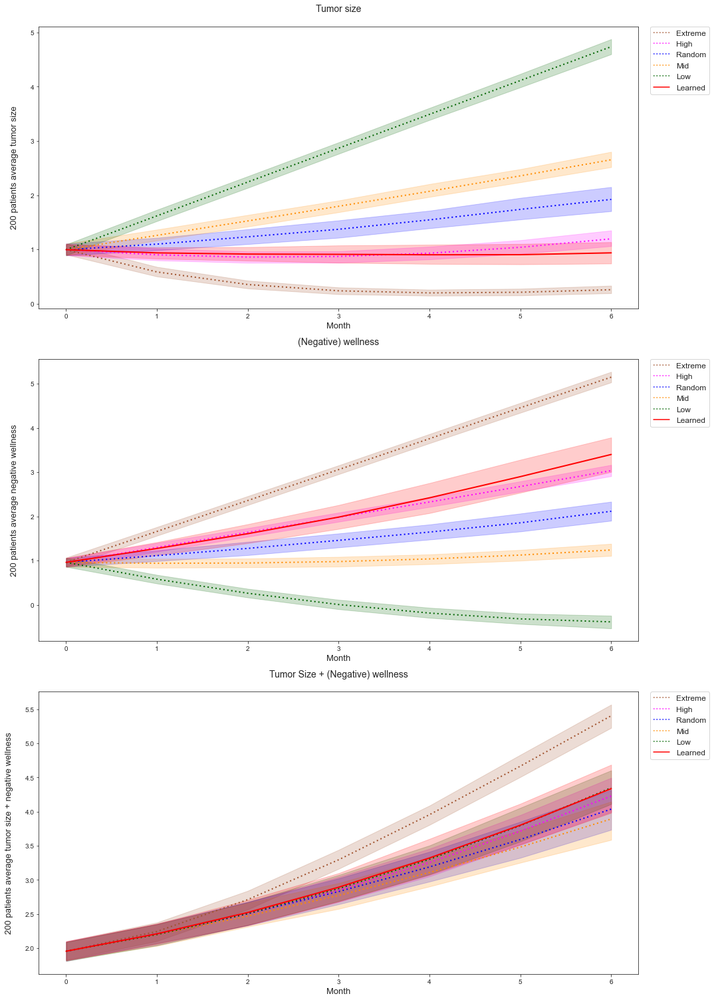


Policy Iteration: 5 - Evaluation results:
                         - Avg. ending tumor size : 0.9403331709339174
                         - Avg. max. toxicity : 6.129854199788727
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.0269556649798948
                         - Avg. prob. of death : 0.7022325926611169



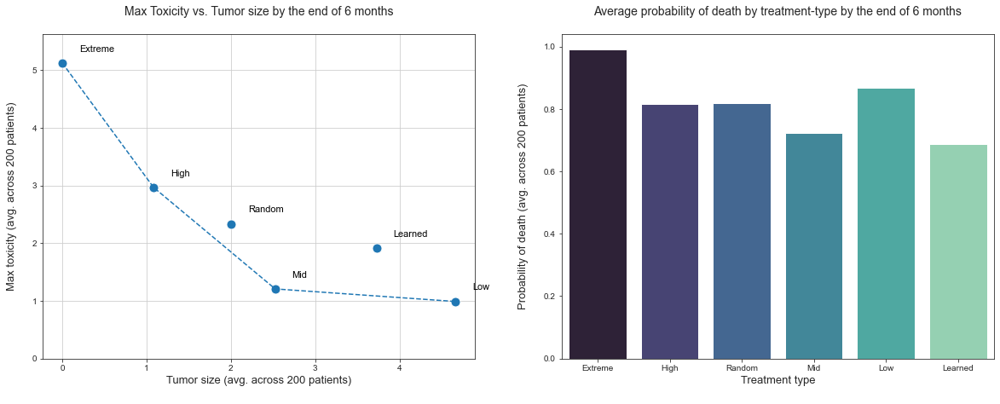

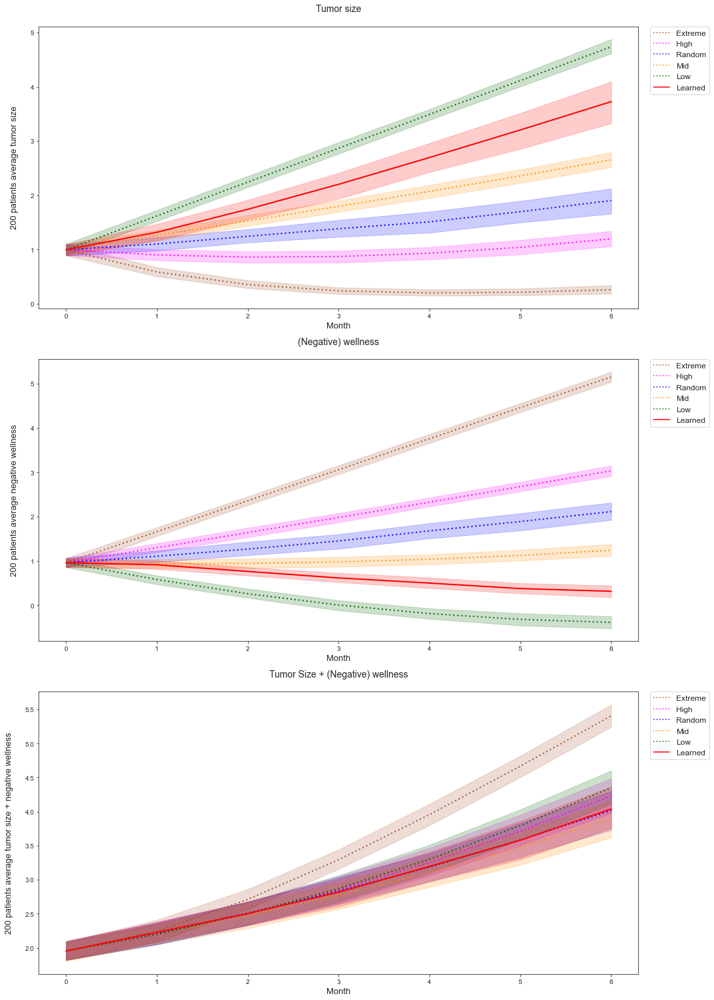


Policy Iteration: 6 - Evaluation results:
                         - Avg. ending tumor size : 3.726698506599192
                         - Avg. max. toxicity : 1.9178738684111512
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.0093106305585504
                         - Avg. prob. of death : 0.6867508526885086



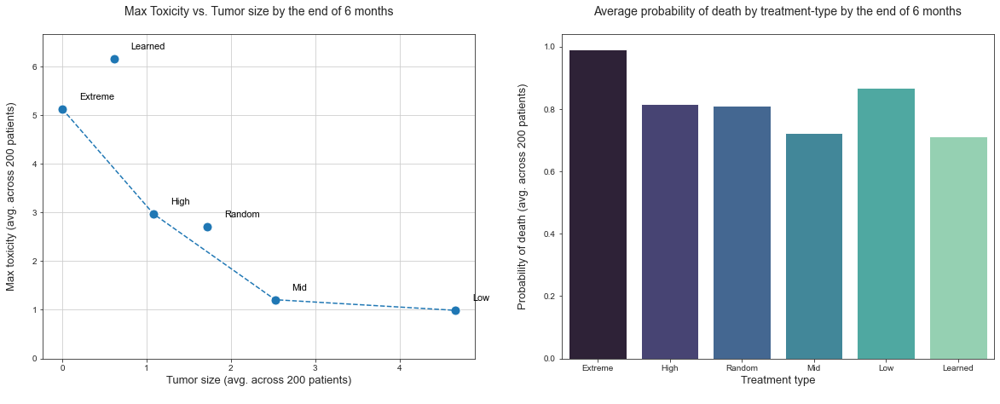

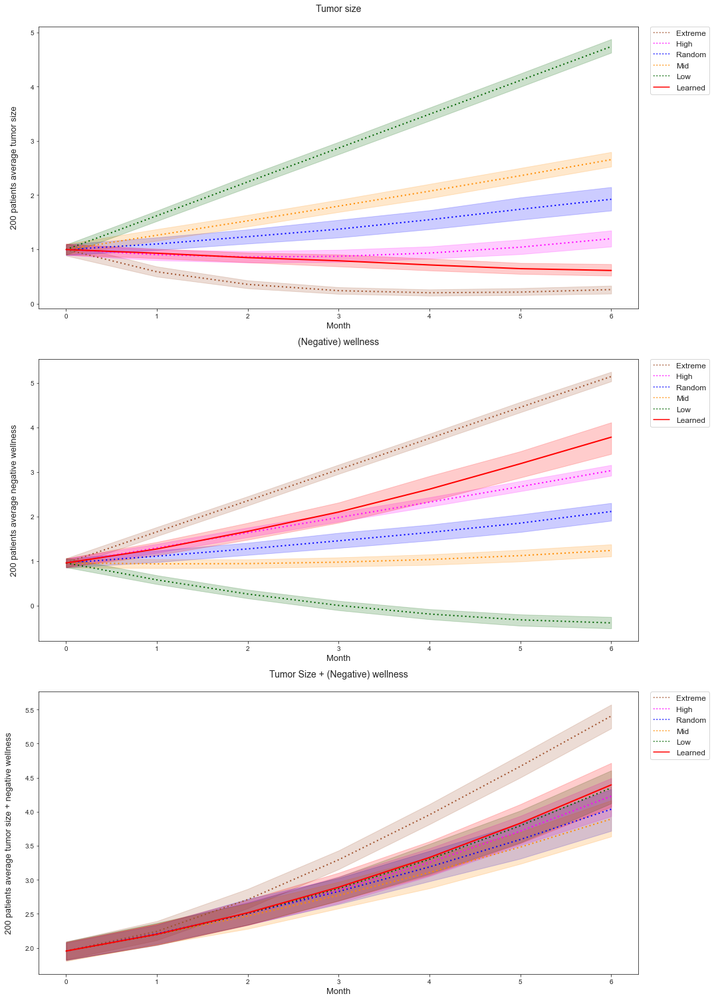


Policy Iteration: 7 - Evaluation results:
                         - Avg. ending tumor size : 0.6146459471688419
                         - Avg. max. toxicity : 6.157892082974226
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.028850191303381
                         - Avg. prob. of death : 0.7116515041192141



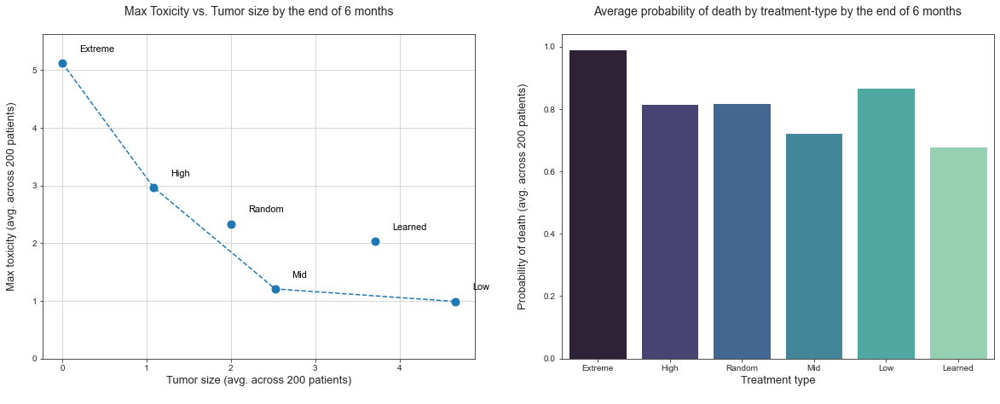

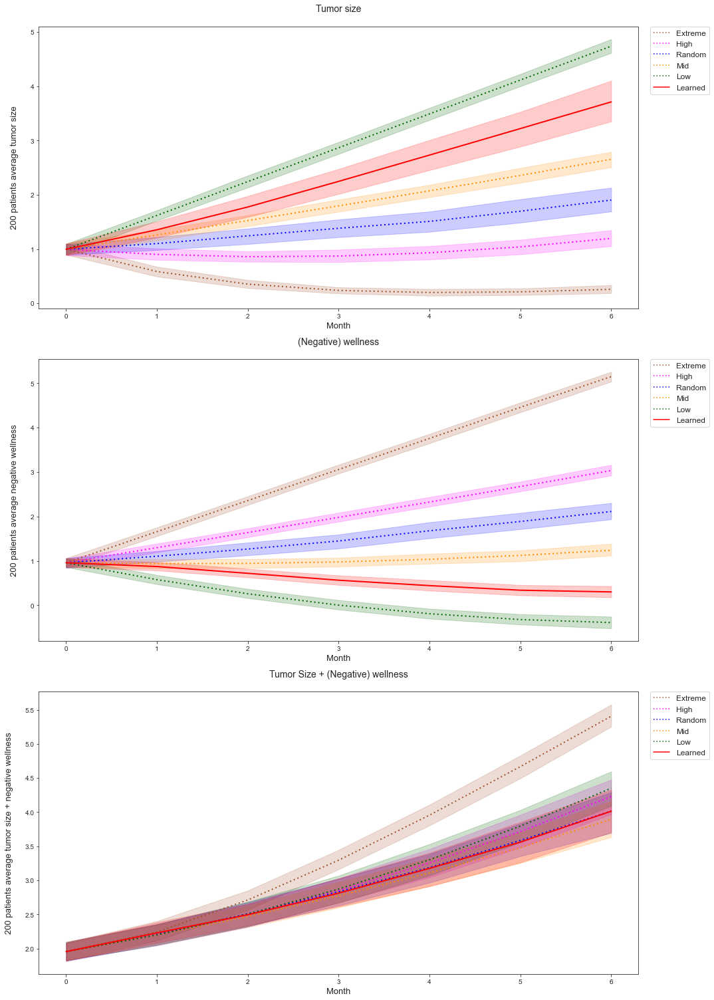


Policy Iteration: 8 - Evaluation results:
                         - Avg. ending tumor size : 3.711818401577334
                         - Avg. max. toxicity : 2.0349749915699658
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.0073773009886224
                         - Avg. prob. of death : 0.6778988067698046



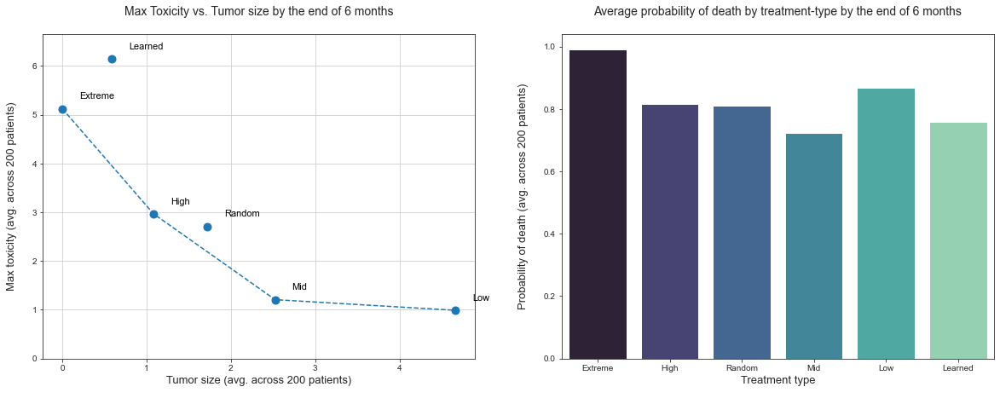

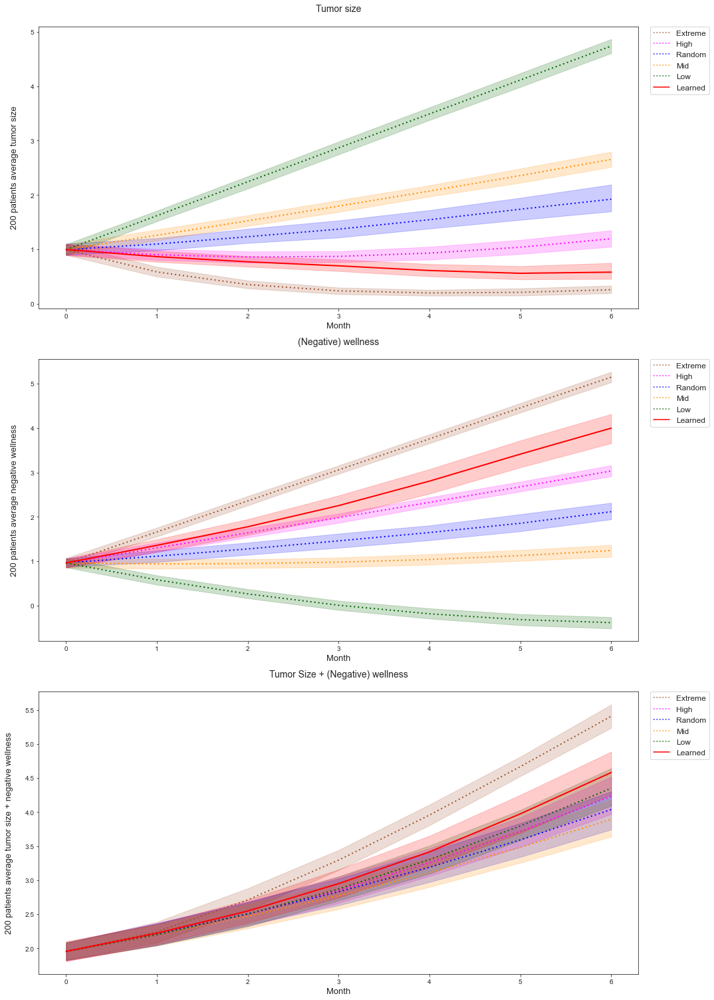


Policy Iteration: 9 - Evaluation results:
                         - Avg. ending tumor size : 0.5860346405173287
                         - Avg. max. toxicity : 6.152413296026907
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.041288999107113
                         - Avg. prob. of death : 0.7585767047927309

Averege death rate increased by 10%! Policy performance decreased! Run-1 terminated!

Evaluations: 100%|██████████| 1/1 [3:03:43<00:00, 11023.46s/it]


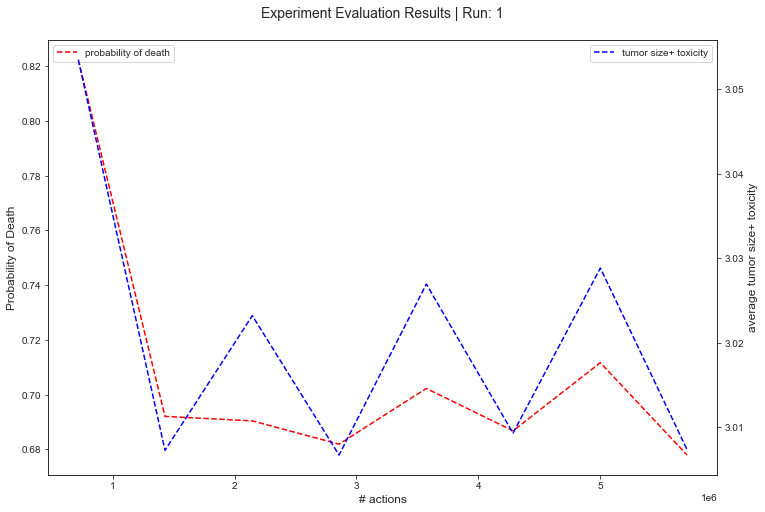

In [4]:
# Experiment execution
agg_results = []

eval_count = len(configs['S'])*len(configs['Actions'])*len(configs['Roll-outs'])*len(configs['Significance'])

pbar_evals = tqdm.tqdm(total=eval_count, desc="Evaluations")

for sample_size in configs['S']:
        
    for rollout_max in configs['Roll-outs']:

        for sig_lvl in configs['Significance']:

            run_results = evaluations_per_config(s_size                     = sample_size
                                                , init_state_group          = configs['init_state_group']

                                                , n_actions                 = configs['Actions'][0]
                                                , max_n_rollouts            = rollout_max
                                                , sig_lvl                   = sig_lvl

                                                , treatment_length_train    = 6
                                                , treatment_length_eval     = 6
                                                
                                                , max_policy_iter_per_run   = 10 # Maximum number of policy iterations per experiment
                                                , runs_per_config           = 1  # Number of experiments per one parameter config

                                                , eval_runs_per_state       = 1  # Episodes to generate from each init. state during evaluation phrase
                                                
                                                , off_policy_explr          = EXPLORE_LOGIC # What algorithm to use

                                                , rollout_tracking          = False # Show rollout info.
                                                , dataset_tracking          = False # Show train dataset

                                                , train_plot_tracking       = False # Show model training plot
                                                , eval_summary_tracking     = True  # Show a policy performance summary of evaluation runs
                                                , policy_behaviour_tracking = False # Show/store policy action selections vs. pendulum angle plot

                                                , show_experiment_run_eval_summary_plot = False # Show death-rate/tumor-size+toxicity vs. action no. plot of exp. run

                                                , use_toxi_n_tumor_for_pref = False # Generate preferences using sum(max-toxi, tumor-size) of rollouts
                                                , set_seed                  = 3
                                                , init_state_tag            = configs['init_state_tag']
                                                )

            agg_results.append(run_results)

            pbar_evals.update(1)
                
pbar_evals.close()

### Modified algorithm

In [5]:
############################################
################## INPUTS ##################

# Configs to test
N_STATES = 1000

configs = { 'CONFIG_NO': 2
          , 'S': [N_STATES]
          , 'Actions' : [6]
          , 'Roll-outs': [10]
          , 'Significance' : [0.1]
          , 'init_state_group': None
          , 'init_state_tag': 'gn'
          }

algorithm = ALGO_TYPE['modified']

############################################
############################################

# Algorithm configs
ALGO_NAME = algorithm['name']
EXPLORE_LOGIC = algorithm['exploration']

Runs:   0%|          | 0/1 [00:00<?, ?it/s]
State generation seed is 3


Currently evaluated configs:
 Samples: 1000 | Actions: 6 | Roll-outs: 10 | Significance: 0.1


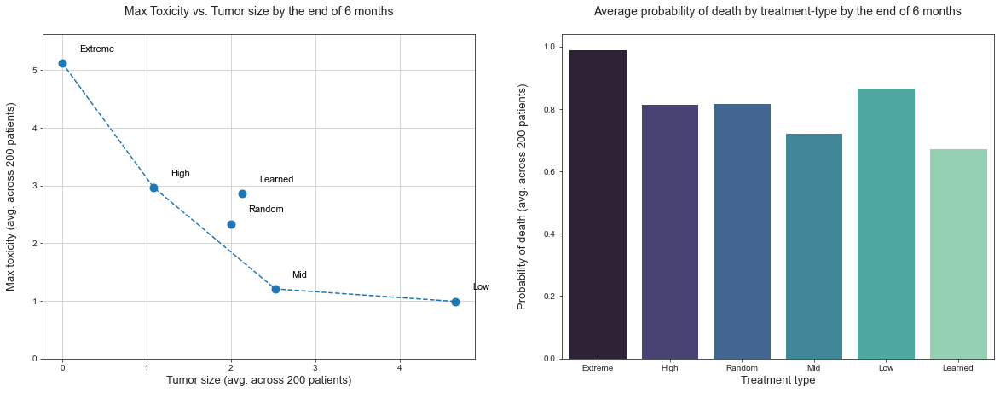

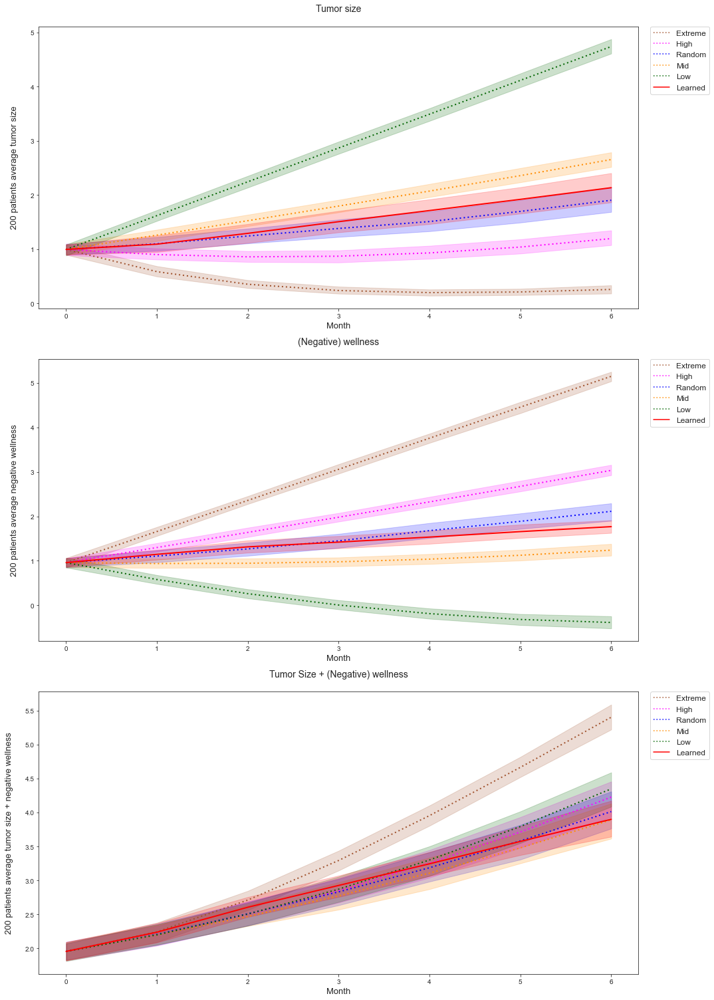


Policy Iteration: 1 - Evaluation results:
                         - Avg. ending tumor size : 2.1342620416141207
                         - Avg. max. toxicity : 2.856065277644441
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.0123428878246745
                         - Avg. prob. of death : 0.6741887314654161



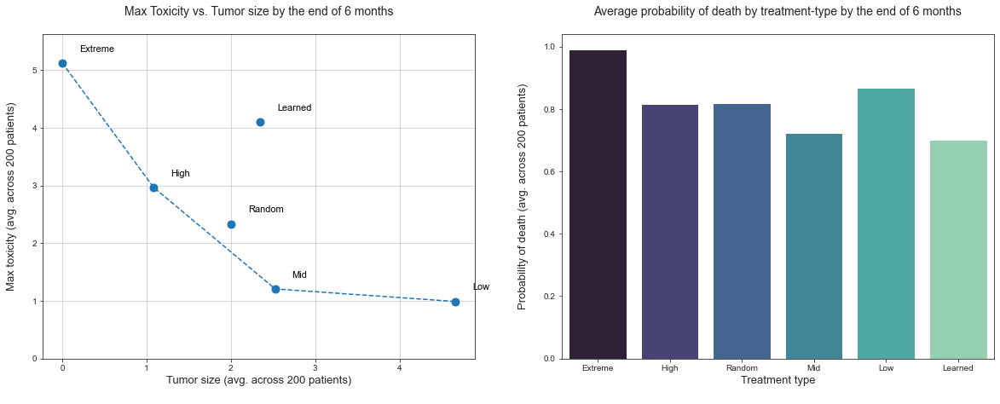

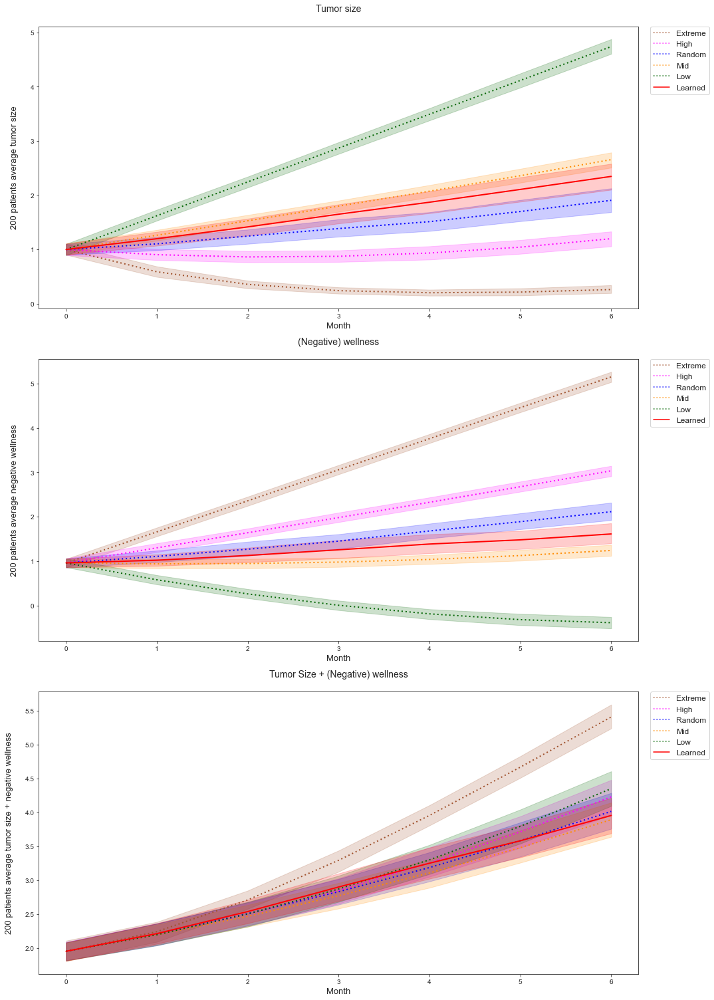


Policy Iteration: 2 - Evaluation results:
                         - Avg. ending tumor size : 2.3444504369535437
                         - Avg. max. toxicity : 4.105841459636069
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.0111694858039884
                         - Avg. prob. of death : 0.7020618337409439



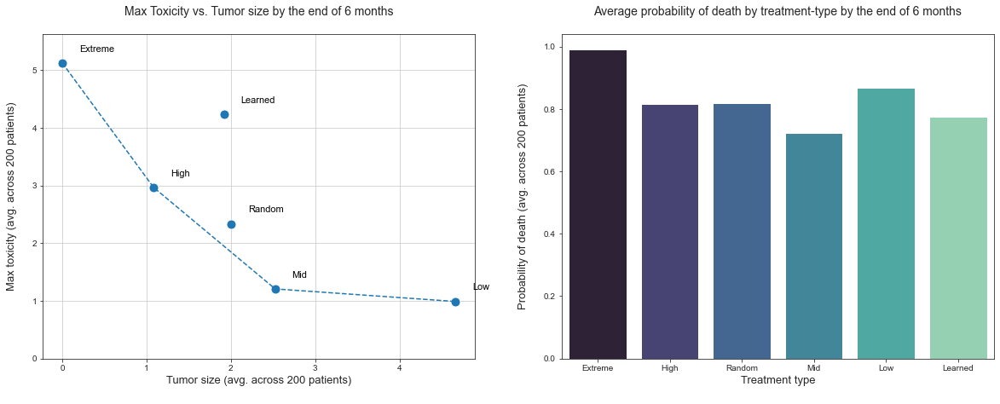

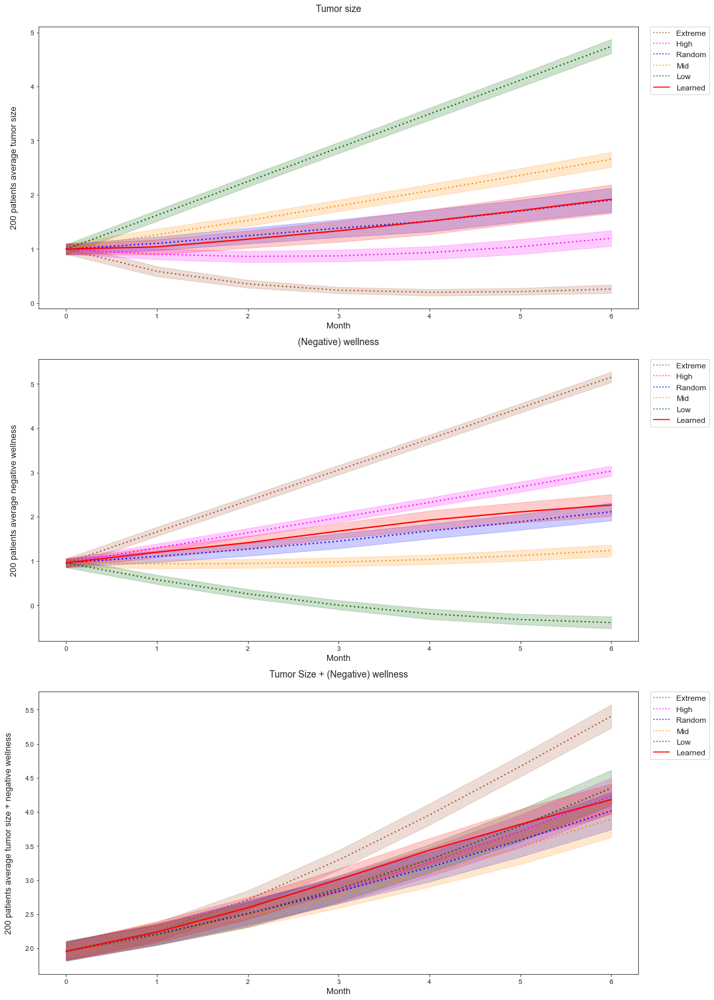


Policy Iteration: 3 - Evaluation results:
                         - Avg. ending tumor size : 1.916548683075857
                         - Avg. max. toxicity : 4.233534304493456
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.030871790099603
                         - Avg. prob. of death : 0.7745913150784535

Averege death rate increased by 10%! Policy performance decreased! Run-1 terminated!

Evaluations: 100%|██████████| 1/1 [46:04<00:00, 2764.91s/it]


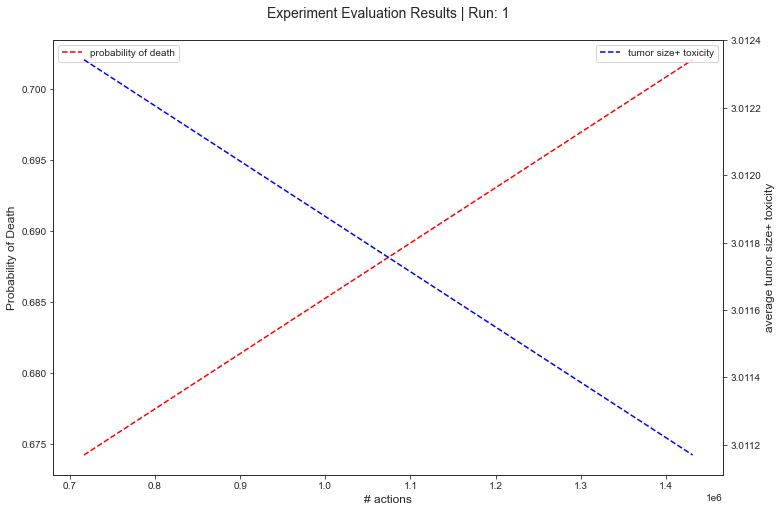

In [6]:
# Experiment execution
agg_results = []

eval_count = len(configs['S'])*len(configs['Actions'])*len(configs['Roll-outs'])*len(configs['Significance'])

pbar_evals = tqdm.tqdm(total=eval_count, desc="Evaluations")

for sample_size in configs['S']:
        
    for rollout_max in configs['Roll-outs']:

        for sig_lvl in configs['Significance']:

            run_results = evaluations_per_config(s_size                     = sample_size
                                                , init_state_group          = configs['init_state_group']  
                                                , n_actions                 = configs['Actions'][0]
                                                , max_n_rollouts            = rollout_max
                                                , sig_lvl                   = sig_lvl

                                                , treatment_length_train    = 6
                                                , treatment_length_eval     = 6
                                                
                                                , max_policy_iter_per_run   = 10 # Maximum number of policy iterations per experiment
                                                , runs_per_config           = 1  # Number of experiments per one parameter config

                                                , eval_runs_per_state       = 1  # Episodes to generate from each init. state during evaluation phrase
                                                
                                                , off_policy_explr          = EXPLORE_LOGIC # What algorithm to use

                                                , rollout_tracking          = False # Show rollout info.
                                                , dataset_tracking          = False # Show train dataset

                                                , train_plot_tracking       = False # Show model training plot
                                                , eval_summary_tracking     = True  # Show a policy performance summary of evaluation runs
                                                , policy_behaviour_tracking = False # Show/store policy action selections vs. pendulum angle plot

                                                , show_experiment_run_eval_summary_plot = False # Show death-rate/tumor-size+toxicity vs. action no. plot of exp. run

                                                , use_toxi_n_tumor_for_pref = False # Generate preferences using sum(max-toxi, tumor-size) of rollouts
                                                , set_seed                  = 3
                                                , init_state_tag            = configs['init_state_tag']
                                                )

            agg_results.append(run_results)

            pbar_evals.update(1)
                
pbar_evals.close()

---
## Using `tumor size + toxicity` to generate preferences

### Original algorithm

In [7]:
############################################
################## INPUTS ##################

# Configs to test
N_STATES = 1000

configs = { 'CONFIG_NO': 3
          , 'S': [N_STATES]
          , 'Actions' : [6]
          , 'Roll-outs': [10]
          , 'Significance' : [0.1]
          , 'init_state_group': None
          , 'init_state_tag': 'gn'
          }

algorithm = ALGO_TYPE['original']

############################################
############################################

# Algorithm configs
ALGO_NAME = algorithm['name']
EXPLORE_LOGIC = algorithm['exploration']

Runs:   0%|          | 0/1 [00:00<?, ?it/s]
State generation seed is 3


Currently evaluated configs:
 Samples: 1000 | Actions: 6 | Roll-outs: 10 | Significance: 0.1


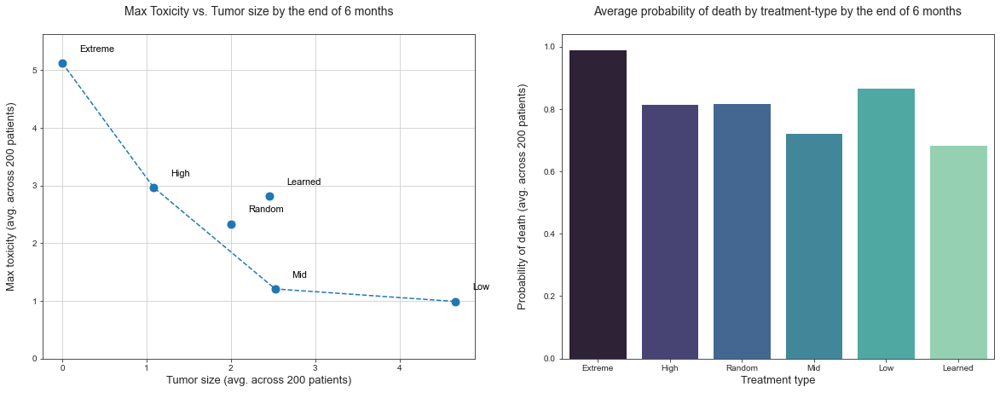

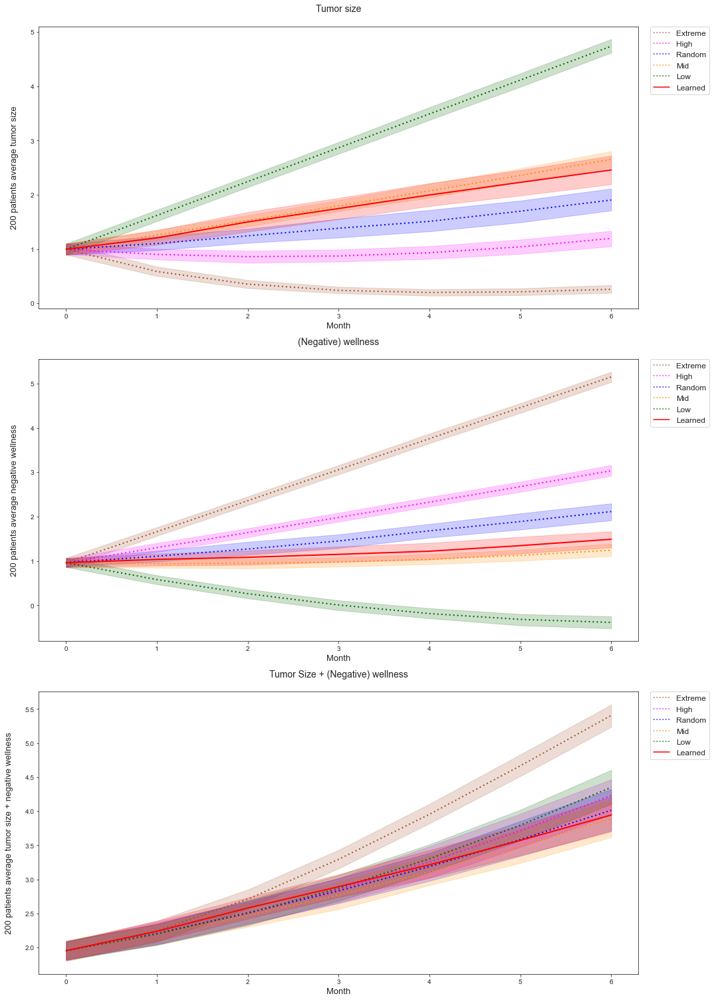


Policy Iteration: 1 - Evaluation results:
                         - Avg. ending tumor size : 2.4575660718494237
                         - Avg. max. toxicity : 2.8115373888096036
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.011132567231042
                         - Avg. prob. of death : 0.6855391808679517



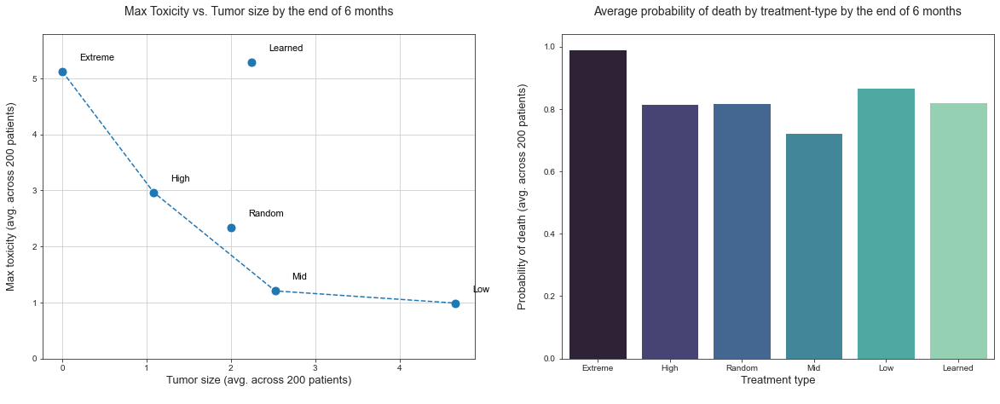

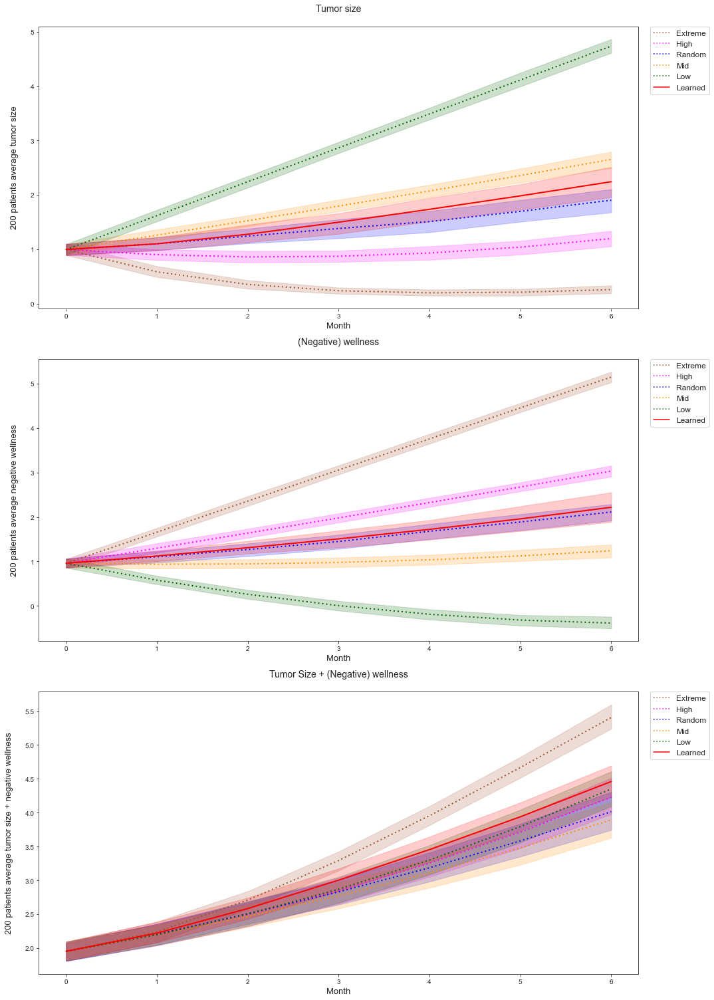


Policy Iteration: 2 - Evaluation results:
                         - Avg. ending tumor size : 2.2429375993850047
                         - Avg. max. toxicity : 5.288863616611265
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.0403733775709294
                         - Avg. prob. of death : 0.8221382055559344

Averege death rate increased by 10%! Policy performance decreased! Run-1 terminated!

Evaluations: 100%|██████████| 1/1 [37:07<00:00, 2227.73s/it]


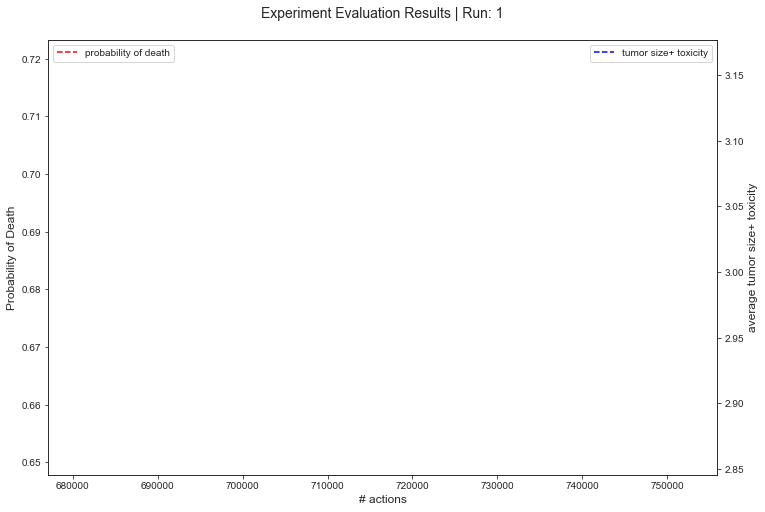

In [8]:
# Experiment execution
agg_results = []

eval_count = len(configs['S'])*len(configs['Actions'])*len(configs['Roll-outs'])*len(configs['Significance'])

pbar_evals = tqdm.tqdm(total=eval_count, desc="Evaluations")

for sample_size in configs['S']:
        
    for rollout_max in configs['Roll-outs']:

        for sig_lvl in configs['Significance']:

            run_results = evaluations_per_config(s_size                     = sample_size
                                                , init_state_group          = configs['init_state_group']

                                                , n_actions                 = configs['Actions'][0]
                                                , max_n_rollouts            = rollout_max
                                                , sig_lvl                   = sig_lvl

                                                , treatment_length_train    = 6
                                                , treatment_length_eval     = 6
                                                
                                                , max_policy_iter_per_run   = 10 # Maximum number of policy iterations per experiment
                                                , runs_per_config           = 1  # Number of experiments per one parameter config

                                                , eval_runs_per_state       = 1  # Episodes to generate from each init. state during evaluation phrase
                                                
                                                , off_policy_explr          = EXPLORE_LOGIC # What algorithm to use

                                                , rollout_tracking          = False # Show rollout info.
                                                , dataset_tracking          = False # Show train dataset

                                                , train_plot_tracking       = False # Show model training plot
                                                , eval_summary_tracking     = True  # Show a policy performance summary of evaluation runs
                                                , policy_behaviour_tracking = False # Show/store policy action selections vs. pendulum angle plot

                                                , show_experiment_run_eval_summary_plot = False # Show death-rate/tumor-size+toxicity vs. action no. plot of exp. run

                                                , use_toxi_n_tumor_for_pref = True # Generate preferences using sum(max-toxi, tumor-size) of rollouts
                                                , set_seed                  = 3
                                                , init_state_tag            = configs['init_state_tag']
                                                )

            agg_results.append(run_results)

            pbar_evals.update(1)
                
pbar_evals.close()

### Modified algorithm

In [9]:
############################################
################## INPUTS ##################

# Configs to test
N_STATES = 1000

configs = { 'CONFIG_NO': 4
          , 'S': [N_STATES]
          , 'Actions' : [6]
          , 'Roll-outs': [10]
          , 'Significance' : [0.1]
          , 'init_state_group': None
          , 'init_state_tag': 'gn'
          }

algorithm = ALGO_TYPE['modified']

############################################
############################################

# Algorithm configs
ALGO_NAME = algorithm['name']
EXPLORE_LOGIC = algorithm['exploration']

Runs:   0%|          | 0/1 [00:00<?, ?it/s]
State generation seed is 3


Currently evaluated configs:
 Samples: 1000 | Actions: 6 | Roll-outs: 10 | Significance: 0.1


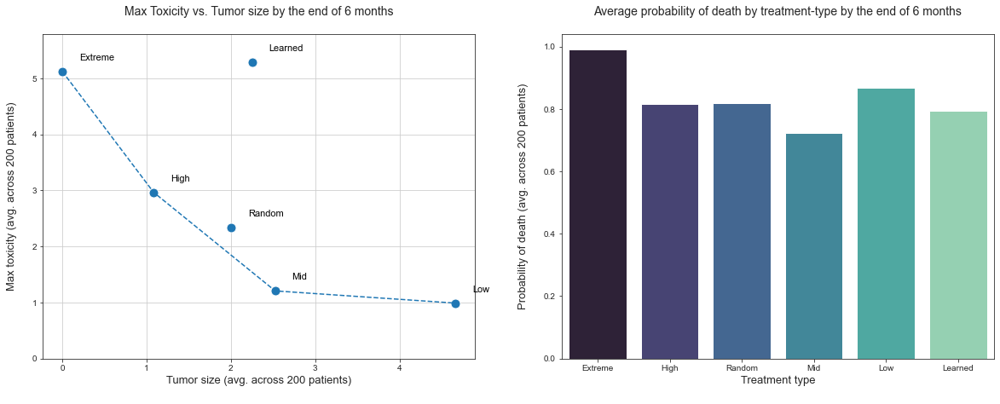

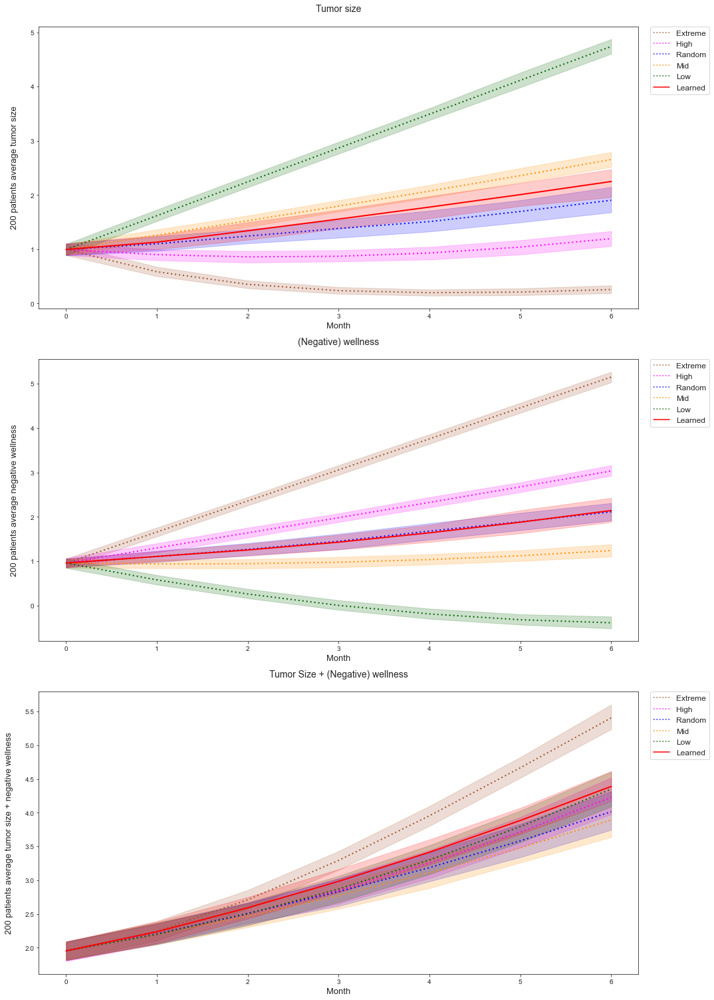


Policy Iteration: 1 - Evaluation results:
                         - Avg. ending tumor size : 2.2493536941266656
                         - Avg. max. toxicity : 5.288433423262952
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.036483220677105
                         - Avg. prob. of death : 0.7933148872878703



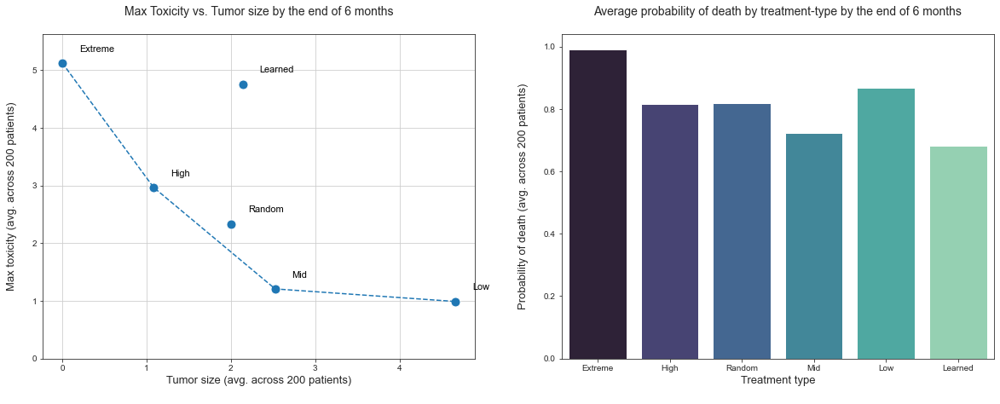

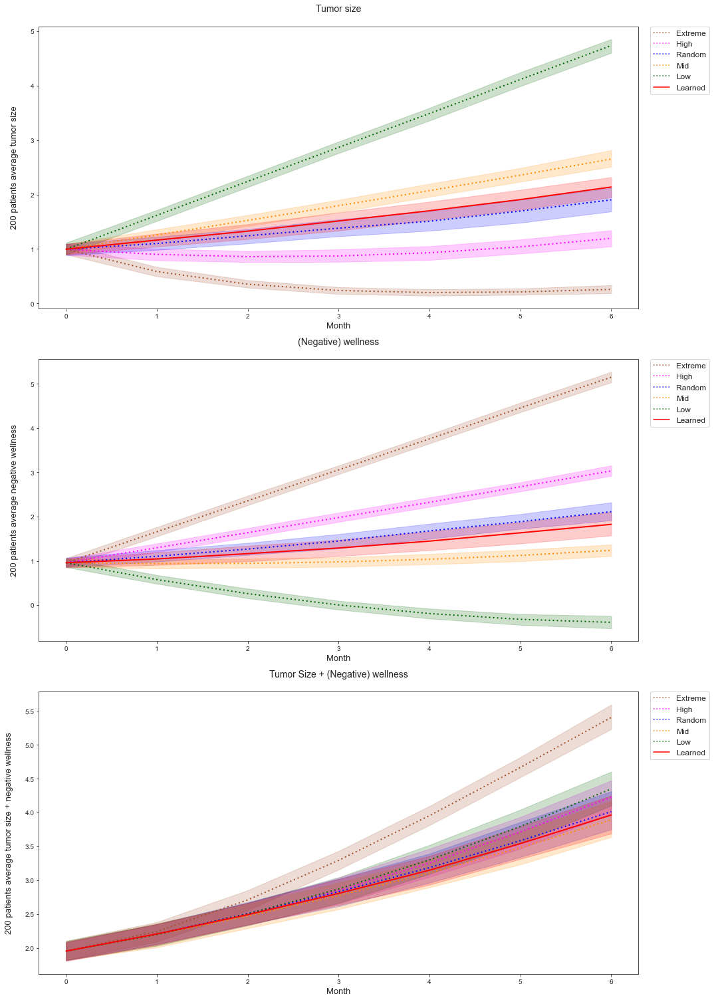


Policy Iteration: 2 - Evaluation results:
                         - Avg. ending tumor size : 2.1391196406387563
                         - Avg. max. toxicity : 4.758373313397061
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.0044643462139597
                         - Avg. prob. of death : 0.6810716983745952



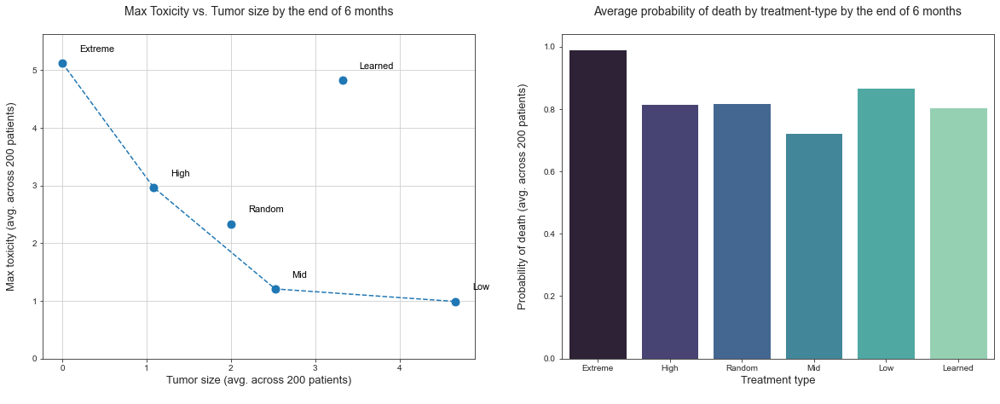

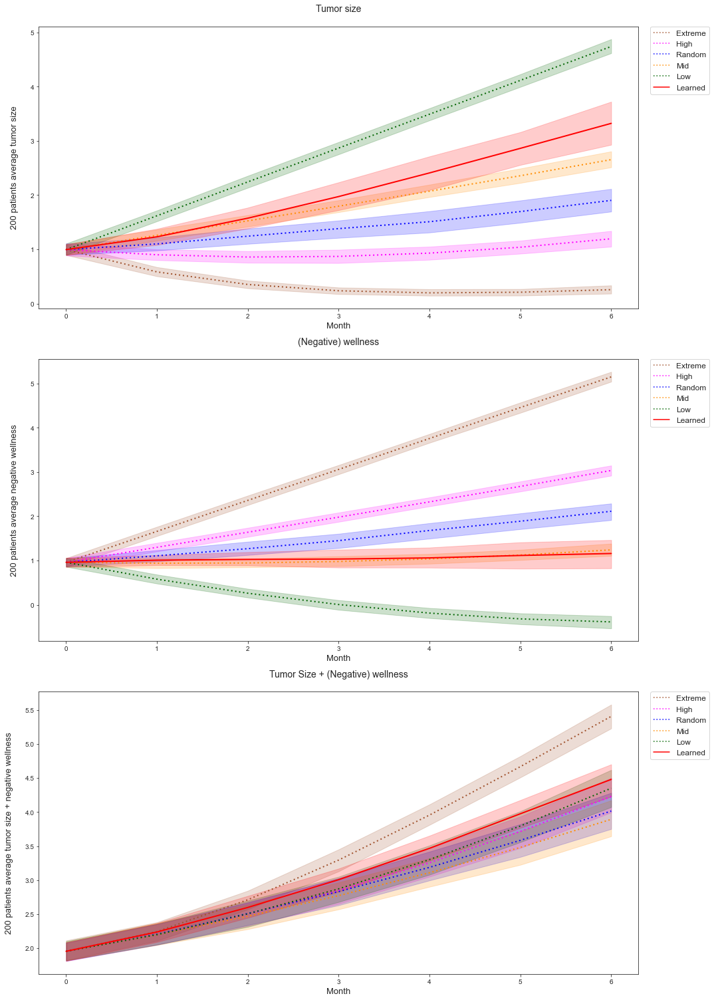


Policy Iteration: 3 - Evaluation results:
                         - Avg. ending tumor size : 3.3222060075181656
                         - Avg. max. toxicity : 4.825808267093543
                         - Avg. tumor size + toxicity (at the end of 6 months): 3.0426206345297473
                         - Avg. prob. of death : 0.8046998264704812

Averege death rate increased by 10%! Policy performance decreased! Run-1 terminated!

Evaluations: 100%|██████████| 1/1 [49:42<00:00, 2982.49s/it]


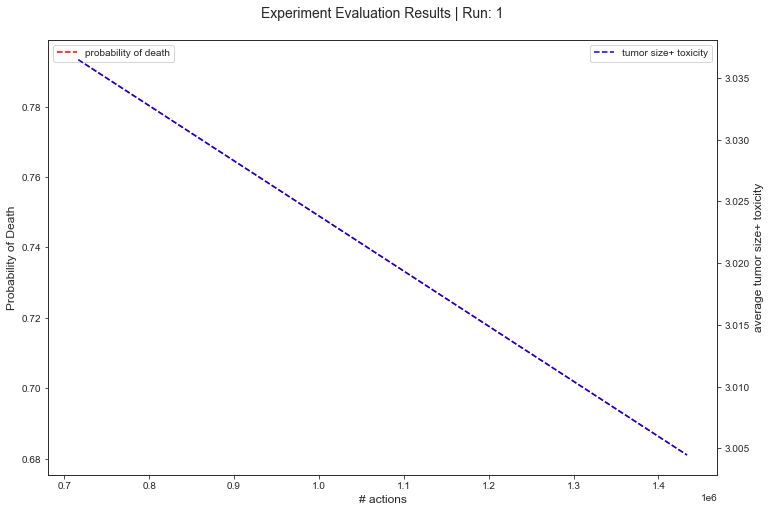

In [10]:
# Experiment execution
agg_results = []

eval_count = len(configs['S'])*len(configs['Actions'])*len(configs['Roll-outs'])*len(configs['Significance'])

pbar_evals = tqdm.tqdm(total=eval_count, desc="Evaluations")

for sample_size in configs['S']:
        
    for rollout_max in configs['Roll-outs']:

        for sig_lvl in configs['Significance']:

            run_results = evaluations_per_config(s_size                     = sample_size
                                                , init_state_group          = configs['init_state_group']

                                                , n_actions                 = configs['Actions'][0]
                                                , max_n_rollouts            = rollout_max
                                                , sig_lvl                   = sig_lvl

                                                , treatment_length_train    = 6
                                                , treatment_length_eval     = 6
                                                
                                                , max_policy_iter_per_run   = 10 # Maximum number of policy iterations per experiment
                                                , runs_per_config           = 1  # Number of experiments per one parameter config

                                                , eval_runs_per_state       = 1  # Episodes to generate from each init. state during evaluation phrase
                                                
                                                , off_policy_explr          = EXPLORE_LOGIC # What algorithm to use

                                                , rollout_tracking          = False # Show rollout info.
                                                , dataset_tracking          = False # Show train dataset

                                                , train_plot_tracking       = False # Show model training plot
                                                , eval_summary_tracking     = True  # Show a policy performance summary of evaluation runs
                                                , policy_behaviour_tracking = False # Show/store policy action selections vs. pendulum angle plot

                                                , show_experiment_run_eval_summary_plot = False # Show death-rate/tumor-size+toxicity vs. action no. plot of exp. run

                                                , use_toxi_n_tumor_for_pref = True # Generate preferences using sum(max-toxi, tumor-size) of rollouts
                                                , set_seed                  = 3
                                                , init_state_tag            = configs['init_state_tag']
                                                )

            agg_results.append(run_results)

            pbar_evals.update(1)
                
pbar_evals.close()

---
## TO-DO: Lengthier treatment regime - 6 months training data -> 12 months evaluation